# Population Model Evaluation

Population-level cache-backed model performance and fold/tissue difficulty analysis.


In [1]:
from pathlib import Path
import sys
import pandas as pd

REPO_ROOT = Path.cwd().resolve()
if not (REPO_ROOT / "src").exists() and (REPO_ROOT.parent / "src").exists():
    REPO_ROOT = REPO_ROOT.parent
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from src.eval_utils.eval_population import *


In [2]:
%matplotlib inline

import importlib
import src.eval_utils.eval_style as eval_style
import src.eval_utils.eda_core as eda_core
import src.eval_utils.eval_population as eval_population
importlib.reload(eval_style)
importlib.reload(eda_core)
importlib.reload(eval_population)
from src.eval_utils.eval_style import *
from src.eval_utils.eval_population import *


## Notebook Configuration

All knobs live in the next cell. Copy this notebook, edit the config, and "Restart & Run All".


In [ ]:
# === Notebook config ===
# Edit this cell, then "Restart & Run All" to re-run end-to-end with a different
# gene list / metric / view filter. Copy-friendly entry point.

set_academic_style()

CFG = EDAConfig(
    csv_path='data/raw/gxp_samples.csv',
    hvg_path='data/raw/gtex_100hvg.txt',
    cache_root='out/loro_subject_cache_coord_vol',  # or 'out/loro_subject_cache_arxiv'
    gene_scope='allgenes',
    plam_cache_dirname='plam',
)
print('analysis scope:', CFG.gene_scope)

# --- Models / cache ---
MODELS                       = ['naive', 'dlam', 'plam']
N_JOBS                       = 16
CACHE_GLOBAL_TABLES          = True
FORCE_REBUILD_GLOBAL_TABLES  = False

# --- Gene list (None = all genes from the cached tables) ---
EVAL_GENE_LIST_PATH          = None  # e.g. 'data/raw/gene_lists/ahba_100hvg.txt' or 'gtex_100hvg'

# --- View filters applied to the population view used by every block below ---
VIEW_SUBSET = dict(
    genes=None,         # e.g. ['FOXP2', 'SLC17A7']
    subjects=None,
    tissues=None,       # gtex_region values, e.g. ['Cortex', 'Cerebellum']
    region_groups=None, # ['cortical', 'subcortical', 'cerebellar']
    sex=None,
    age=None,
)

# --- Metric defaults ---
DEFAULT_METRIC               = 'pearson_r'                  # legend annotation + box plots
TABLE_METRICS                = ['pearson_r', 'r2', 'rmse']
DISTRIBUTION_KIND            = 'box'                        # 'box' | 'violin'

# --- Stratified scatter ---
SCATTER_MAX_POINTS_PER_MODEL = 100_000
SCATTER_BALANCED_SAMPLING    = True   # visual only; metric averaging always uses the full view

# --- Sandbox scatter (top-of-notebook test cell) ---
SANDBOX_COLOR_BY             = 'region'   # none | region_group | region | subject | gene | sex | age
SANDBOX_TOP_N                = 11
SANDBOX_KWS = dict(
    max_points_per_model=100_000,
    balanced_sampling=True,
    axis_limit_quantiles=(0.05, 0.95),
    point_size=1,
    alpha=0.30,
    rasterized=True,
)


analysis scope: allgenes


## Shared Reconstruction

`PREPOST` is rebuilt here because fold-combo and held-out-region summaries need target metadata and observed-region structure.


In [4]:
PREPOST = prepare_pre_post_harmonization_cached(CFG)
print('subjects:', len(PREPOST['subjects']))
print('genes:', len(PREPOST['genes']))
print('parcels:', PREPOST['raw_cube'].shape[1])


[prepost_cache] miss notebooks/cache/prepost/76a000d6a7c5c273.pkl — computing PREPOST (this is the slow path)...
[prepost_cache] computed in 33.6s, cached to notebooks/cache/prepost/76a000d6a7c5c273.pkl (10392.1 MB)
subjects: 318
genes: 13618
parcels: 150


## Global Prediction Tables

Build or load the canonical all-gene wide evaluation tables. The truth and prediction tables share identical `subject_region_key` row order.


In [5]:
truth_df, pred_dfs, global_manifest = build_global_prediction_tables(
    cfg=CFG,
    prepost=PREPOST,
    models=MODELS,
    cache=CACHE_GLOBAL_TABLES,
    force_rebuild=FORCE_REBUILD_GLOBAL_TABLES,
    n_jobs=N_JOBS,
)

manifest_summary = {
    k: global_manifest.get(k)
    for k in [
        'created_at_utc',
        'cache_dir',
        'source_cache_root',
        'gene_scope',
        'models',
        'truth_expression_space',
        'prediction_expression_space',
        'gtex_rep_mode',
        'gtex_hemi_mode',
        'n_rows',
        'n_genes',
        'n_subjects',
        'n_parcels',
    ]
}
display(pd.Series(manifest_summary, name='global_eval_manifest'))
display(truth_df.head())
print({model: df.shape for model, df in pred_dfs.items()})


created_at_utc                                  2026-05-07T14:43:16.553965+00:00
cache_dir                      /scratch/asr655/neuroinformatics/Seq2GeneEx/gt...
source_cache_root                               out/loro_subject_cache_coord_vol
gene_scope                                                              allgenes
models                                                       [naive, dlam, plam]
truth_expression_space                                                harmonized
prediction_expression_space                                           harmonized
gtex_rep_mode                                                           centroid
gtex_hemi_mode                                                       mirror_left
n_rows                                                                      2650
n_genes                                                                    13618
n_subjects                                                                   318
n_parcels                   

,subject,age,sex,subject_region_key,parcel_idx,gtex_region,ahba_region,region_group,gtex_coordinates_raw,gtex_rep_x,...,MRM1,HIST1H4A,GOLGA6L10,HIST1H2AM,HIST1H4B,HIST1H3H,MRPL45,PCDH20,PAGR1,TMEM265
0,GTEX-1117F,64,F,GTEX-1117F|7,7,Cerebellar hemisphere,Cerebellar_Region7,cerebellar,"[(-26.04206099, -53.60357518, -51.26077813), (...",-33.487977,...,3.178267,1.740373,3.660016,5.014279,5.169318,2.252347,5.884637,1.465998,6.760264,3.586174
1,GTEX-1117F,64,F,GTEX-1117F|10,10,brain - caudate (basal ganglia),LH-Ca,subcortical,"[(-13.71428571, 6.556257901390637, 8.983565107...",-14.216461,...,3.207861,1.594440,3.667720,4.912463,5.166440,1.654384,5.846271,4.061602,6.492515,3.105149
2,GTEX-1117F,64,F,GTEX-1117F|18,18,brain - nucleus accumbens (basal ganglia),LH-NAC,subcortical,"[(-9.566666667, 7.900000000000006, -9.53333333...",-9.934848,...,3.218825,1.595347,3.657292,5.010026,5.168799,1.926861,5.819840,4.424085,6.491893,3.142409
3,GTEX-1117F,64,F,GTEX-1117F|19,19,brain - putamen (basal ganglia),LH-Pu,subcortical,"[(-25.11581292, 0.3563474387527776, 0.59910913...",-25.496385,...,3.211374,1.594484,3.674644,5.009779,5.164707,1.778063,5.869787,3.737970,6.480674,3.062304
4,GTEX-1117F,64,F,GTEX-1117F|29,29,brain - amygdala,LH_Amygdala,subcortical,"[(-23.28113879, -4.555160142, -19.82918149), (...",-23.590901,...,3.173328,1.594445,3.668099,4.855075,5.168274,2.490419,5.961003,3.050115,6.445765,3.078911


{'naive': (2650, 13636), 'dlam': (2650, 13636), 'plam': (2650, 13636)}


## Scatter Sandbox

Free-form scatter for visual debugging. Edit `SANDBOX_*` knobs in the config cell or override
locally without rerunning the rest of the notebook. Metric averaging is sample-wise — see the
stratification sections below for formal numbers.


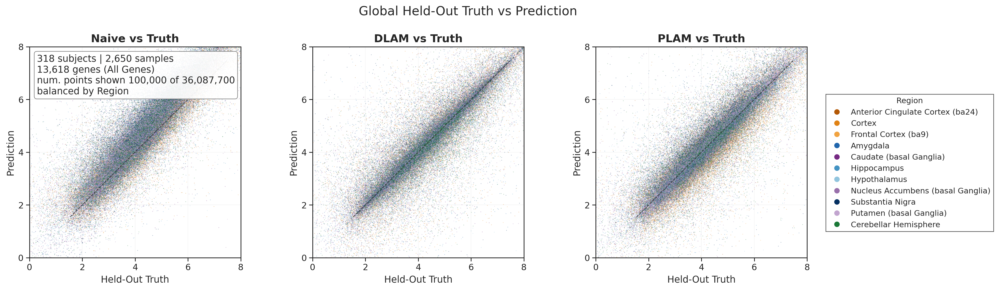

In [6]:
sandbox_view = make_prediction_eval_view(
    truth_df=truth_df,
    pred_dfs=pred_dfs,
    eval_gene_list_path=EVAL_GENE_LIST_PATH,
    models=MODELS,
    **VIEW_SUBSET,
)

fig, axes = plot_global_prediction_scatter(
    sandbox_view,
    color_by=SANDBOX_COLOR_BY,
    top_n=SANDBOX_TOP_N,
    **SANDBOX_KWS,
)


## Sample-Wise Performance — Stratified Sections

**Averaging.** For each stratum and the global case, per-sample metrics are computed across genes
for every `subject_region_key`, then aggregated as `mean ± std` across samples in the stratum.
Balanced sampling only affects which points appear in the scatter — it never enters metric math.

The shared `strat_view` below is reused by every section. To analyze a sub-stratum (e.g.
subcortical only), build a filtered view via `make_prediction_eval_view(...)` and rerun the
helpers in a new cell.


In [7]:
strat_view = make_prediction_eval_view(
    truth_df=truth_df,
    pred_dfs=pred_dfs,
    eval_gene_list_path=EVAL_GENE_LIST_PATH,
    models=MODELS,
    **VIEW_SUBSET,
)


### Global

No stratification. Per-panel scatter shows global per-model `R` (or chosen metric); the box
plot summarizes per-sample distributions across the three models.


/scratch/asr655/neuroinformatics/Seq2GeneEx/gtex_gp/src/eval_utils/eval_population.py:3645: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/scratch/asr655/neuroinformatics/Seq2GeneEx/gtex_gp/src/eval_utils/eval_population.py:3672: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([model_label(t.get_text()) for t in ax.get_xticklabels()])


model          Naive                                         DLAM  \
metric     pearson_r           r2         rmse     n    pearson_r   
stratum                                                             
global   0.863±0.035  0.632±0.124  1.036±0.190  2650  0.869±0.099   

model                                           PLAM               \
metric            r2         rmse     n    pearson_r           r2   
stratum                                                             
global   0.556±0.700  0.990±0.577  2650  0.874±0.083  0.697±0.280   

model                       
metric          rmse     n  
stratum                     
global   0.888±0.335  2650

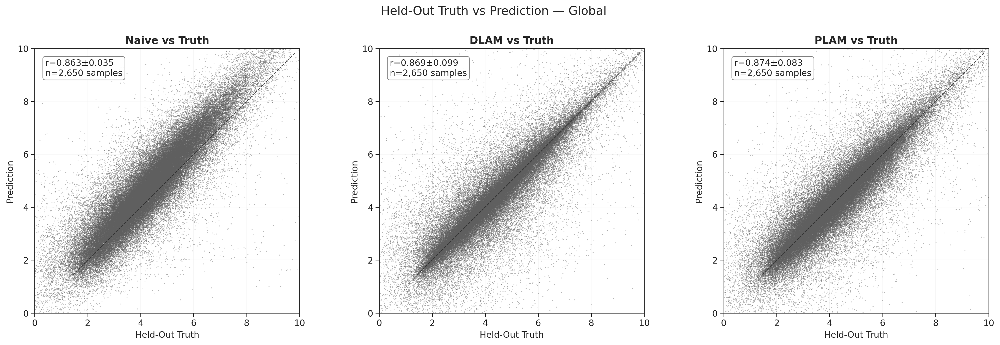

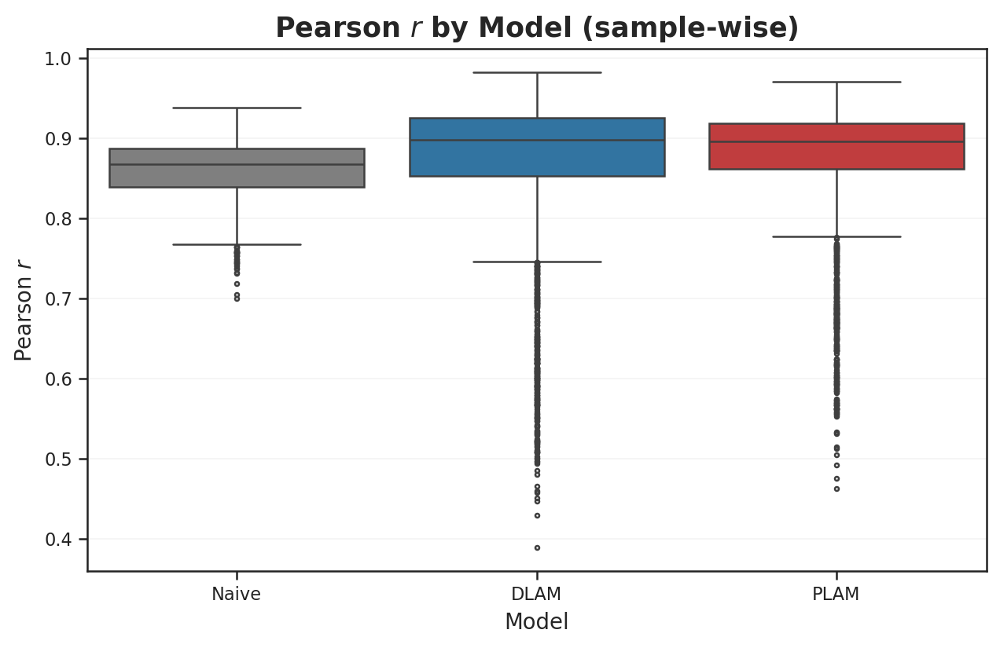

In [8]:
global_metrics, global_summary = compute_prediction_metrics(
    strat_view, unit='sample', stratify_by=None,
    metrics=TABLE_METRICS, n_jobs=N_JOBS,
)

fig, axes, _ = plot_stratified_scatter(
    strat_view, stratify_by=None,
    default_metric=DEFAULT_METRIC,
    max_points_per_model=SCATTER_MAX_POINTS_PER_MODEL,
    balanced_sampling=SCATTER_BALANCED_SAMPLING,
    metric_summary=global_summary,
)

fig, ax = plot_stratified_distribution(
    global_metrics, stratify_by=None,
    metric=DEFAULT_METRIC, kind=DISTRIBUTION_KIND,
)

global_table = format_stratified_metric_table(
    global_metrics, stratify_by=None, metrics=TABLE_METRICS,
)
display(global_table)


/scratch/asr655/neuroinformatics/Seq2GeneEx/gtex_gp/src/eval_utils/eval_population.py:3645: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/scratch/asr655/neuroinformatics/Seq2GeneEx/gtex_gp/src/eval_utils/eval_population.py:3672: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([model_label(t.get_text()) for t in ax.get_xticklabels()])


model          Naive                                         DLAM  \
metric     pearson_r           r2         rmse     n    pearson_r   
stratum                                                             
global   0.863±0.035  0.632±0.124  1.036±0.190  2650  0.869±0.099   

model                                           PLAM               \
metric            r2         rmse     n    pearson_r           r2   
stratum                                                             
global   0.556±0.700  0.990±0.577  2650  0.874±0.083  0.697±0.280   

model                       
metric          rmse     n  
stratum                     
global   0.888±0.335  2650

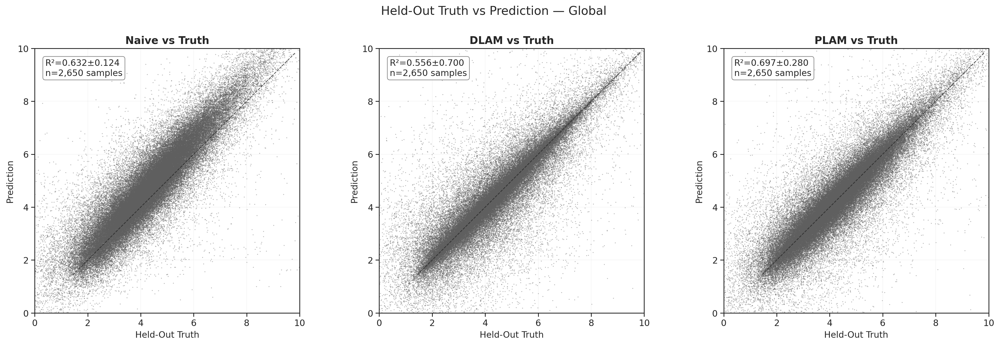

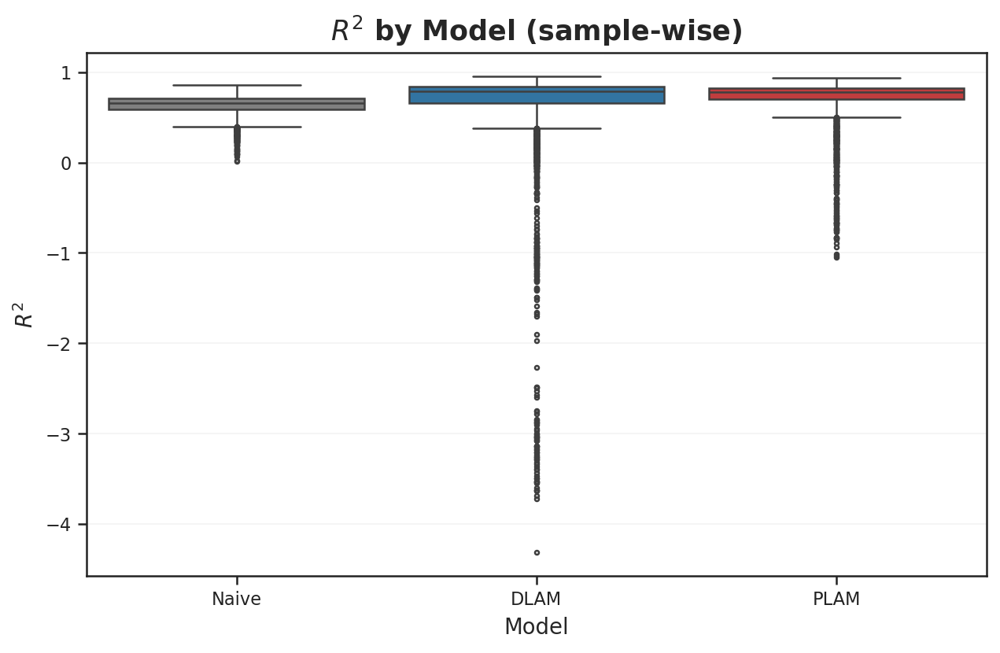

In [9]:
fig, axes, _ = plot_stratified_scatter(
    strat_view, stratify_by=None,
    default_metric='r2',
    max_points_per_model=SCATTER_MAX_POINTS_PER_MODEL,
    balanced_sampling=SCATTER_BALANCED_SAMPLING,
    metric_summary=global_summary,
)

fig, ax = plot_stratified_distribution(
    global_metrics, stratify_by=None,
    metric='r2', kind=DISTRIBUTION_KIND,
)

global_table = format_stratified_metric_table(
    global_metrics, stratify_by=None, metrics=TABLE_METRICS,
)
display(global_table)


### Stratified by Sex

When `SHOW_BIAS_FOREST=True`, a forest panel below the box plot reports the LMM-adjusted
contrast (Δ Pearson r vs reference category) for each model after controlling for
age, subject coverage, and `gtex_region`. Subject is a random intercept (each subject
contributes up to 13 region samples). Outcome is Fisher-z transformed for stable
inference and back-transformed for display. p-values FDR-corrected (BH) across all
non-reference contrasts.


model         Naive                                         DLAM               \
metric    pearson_r           r2         rmse     n    pearson_r           r2   
sex                                                                             
F       0.888±0.032  0.684±0.117  0.917±0.173   673  0.852±0.108  0.454±0.866   
M       0.854±0.031  0.614±0.121  1.076±0.179  1977  0.875±0.095  0.591±0.631   

model                             PLAM                                  
metric         rmse     n    pearson_r           r2         rmse     n  
sex                                                                     
F       1.038±0.650   673  0.867±0.091  0.656±0.341  0.898±0.370   673  
M       0.973±0.550  1977  0.877±0.080  0.711±0.255  0.884±0.322  1977

/ext3/miniforge3/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/tmp/ipykernel_2811606/3349387319.py:31: RuntimeWarning: compute_stratum_bias: LMM fit failed for model='naive' (LinAlgError: Singular matrix); falling back to OLS + cluster-robust SEs.
  sex_bias = compute_stratum_bias(
/ext3/miniforge3/lib/python3.12/site-packages/statsmodels/base/model.py:1912: FutureWarning: The behavior of wald_test will change after 0.14 to returning scalar test statistic values. To get the future behavior now, set scalar to True. To silence this message while retaining the legacy behavior, set scalar to False.
  warnings.warn(
/ext3/miniforge3/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/tmp/ipykernel_2811606/3349387319.py:31: RuntimeWarning: compute_stratum_bias: LMM fit failed for model='

,model,category,is_reference,n,adj_mean,adj_mean_ci_lo,adj_mean_ci_hi,delta_vs_ref,delta_ci_lo,delta_ci_hi,p_raw,p_fdr,method
0,naive,F,True,673,0.892716,0.890143,0.895233,NaN,NaN,NaN,NaN,NaN,ols_cluster
1,naive,M,False,1977,0.856704,0.855345,0.858051,-0.036012,-0.039660,-0.032448,0.000000,0.000000,ols_cluster
3,dlam,F,True,673,0.880220,0.876574,0.883765,NaN,NaN,NaN,NaN,NaN,ols_cluster
4,dlam,M,False,1977,0.897191,0.895450,0.898904,0.016971,0.013342,0.020483,0.000000,0.000000,ols_cluster
6,plam,F,True,673,0.888728,0.886098,0.891302,NaN,NaN,NaN,NaN,NaN,ols_cluster
7,plam,M,False,1977,0.893446,0.892523,0.894361,0.004718,0.002015,0.007357,0.000695,0.000695,ols_cluster


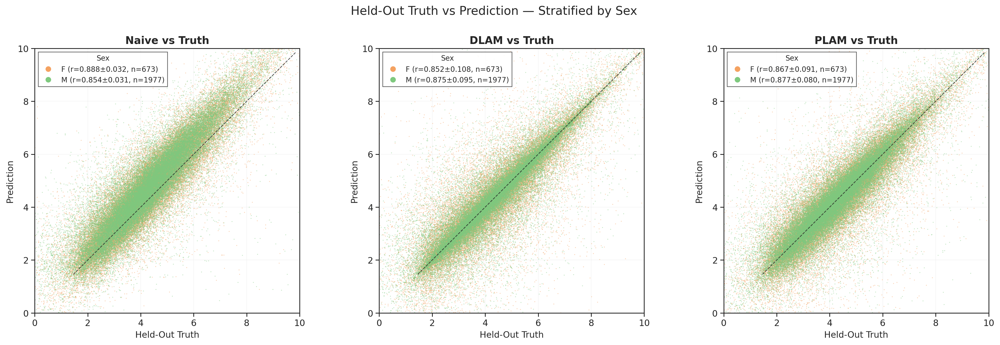

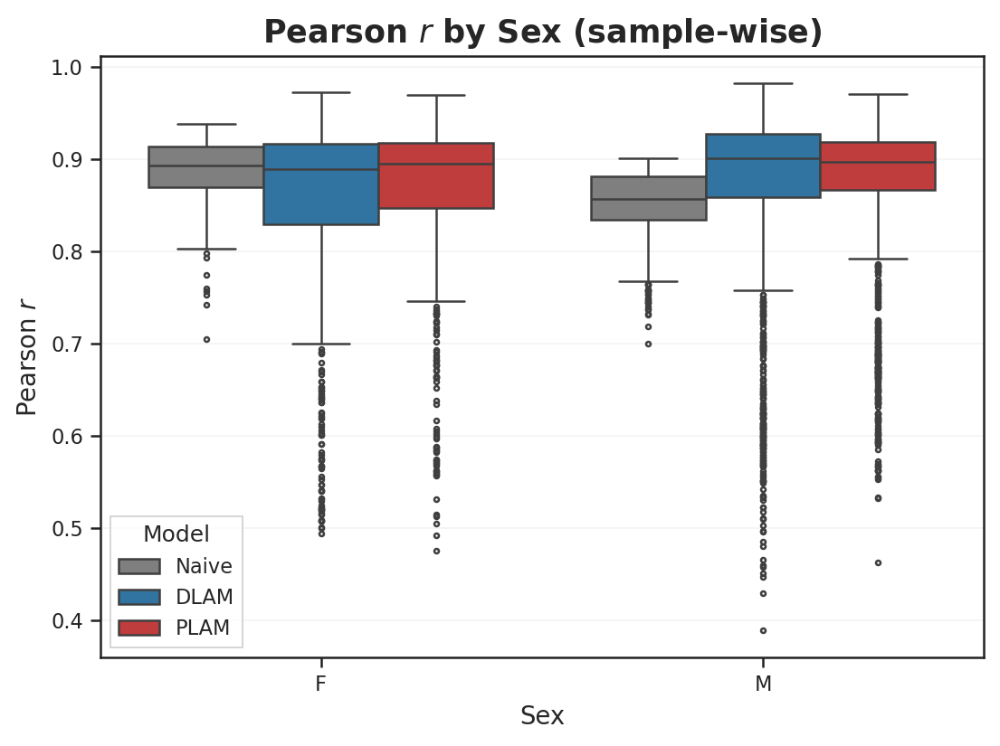

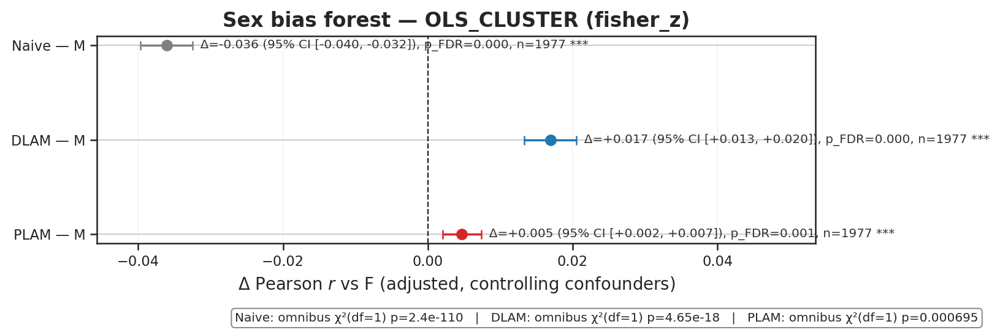

In [10]:

# --- Sex bias forest (LMM with subject random intercept; controls for age, coverage, region) ---
SHOW_BIAS_FOREST             = True
BIAS_METHOD                  = 'lmm'        # 'lmm' | 'ols_cluster'
BIAS_CONTROLS                = ('age', 'subject_coverage', 'gtex_region')
BIAS_REFERENCE_SEX           = None         # None = first level alphabetically

sex_metrics, sex_summary = compute_prediction_metrics(
    strat_view, unit='sample', stratify_by='sex',
    metrics=TABLE_METRICS, n_jobs=N_JOBS,
)

fig, axes, _ = plot_stratified_scatter(
    strat_view, stratify_by='sex',
    default_metric=DEFAULT_METRIC,
    max_points_per_model=SCATTER_MAX_POINTS_PER_MODEL,
    balanced_sampling=SCATTER_BALANCED_SAMPLING,
    metric_summary=sex_summary,
)

fig, ax = plot_stratified_distribution(
    sex_metrics, stratify_by='sex',
    metric=DEFAULT_METRIC, kind=DISTRIBUTION_KIND,
)

sex_table = format_stratified_metric_table(
    sex_metrics, stratify_by='sex', metrics=TABLE_METRICS,
)
display(sex_table)

if SHOW_BIAS_FOREST:
    sex_bias = compute_stratum_bias(
        sex_metrics,
        axis='sex',
        models=MODELS,
        metric=DEFAULT_METRIC,
        controls=BIAS_CONTROLS,
        method=BIAS_METHOD,
        reference_category=BIAS_REFERENCE_SEX,
    )
    display(sex_bias[sex_bias['category'] != '__omnibus__'][[
        'model','category','is_reference','n','adj_mean','adj_mean_ci_lo','adj_mean_ci_hi',
        'delta_vs_ref','delta_ci_lo','delta_ci_hi','p_raw','p_fdr','method',
    ]])
    fig_b, ax_b = plot_stratum_bias_forest(sex_bias)


### Stratified by Age (Decade)


model         Naive                                         DLAM  \
metric    pearson_r           r2         rmse     n    pearson_r   
age                                                                
24      0.866±0.045  0.664±0.126  0.987±0.221    61  0.609±0.073   
34      0.864±0.039  0.651±0.125  1.008±0.200    85  0.693±0.067   
44      0.866±0.036  0.646±0.125  1.011±0.200   241  0.817±0.050   
54      0.862±0.036  0.634±0.123  1.036±0.192   799  0.934±0.036   
64      0.863±0.033  0.626±0.124  1.044±0.186  1339  0.889±0.035   
74      0.859±0.031  0.627±0.118  1.044±0.171   125  0.583±0.052   

model                                           PLAM                \
metric            r2         rmse     n    pearson_r            r2   
age                                                                  
24      -3.144±0.388  3.487±0.127    61  0.617±0.065  -0.563±0.251   
34      -1.109±0.277  2.491±0.133    85  0.719±0.061   0.096±0.186   
44       0.226±0.164  1.499±0.147   241  0.843±0.045   0.599±0.116   
54       0.839±0.092  0.672±0.184   799  0.933±0.028   0.854±0.064   
64       0.772±0.080  0.812±0.135  1339  0.887±0.026   0.763±0.062   
74       0.020±0.161  1.703±0.138   125  0.653±0.050   0.197±0.169   

model                      
metric         rmse     n  
age                        
24      2.136±0.163    61  
34      1.626±0.165    85  
44      1.072±0.153   241  
54      0.648±0.137   799  
64      0.833±0.112  1339  
74      1.540±0.168   125

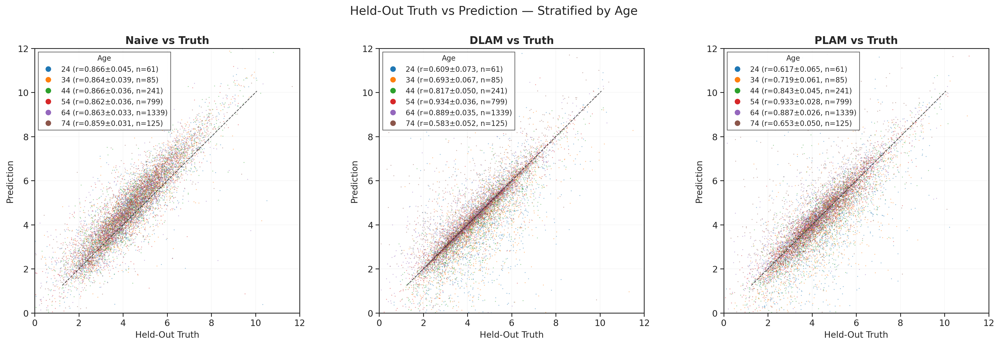

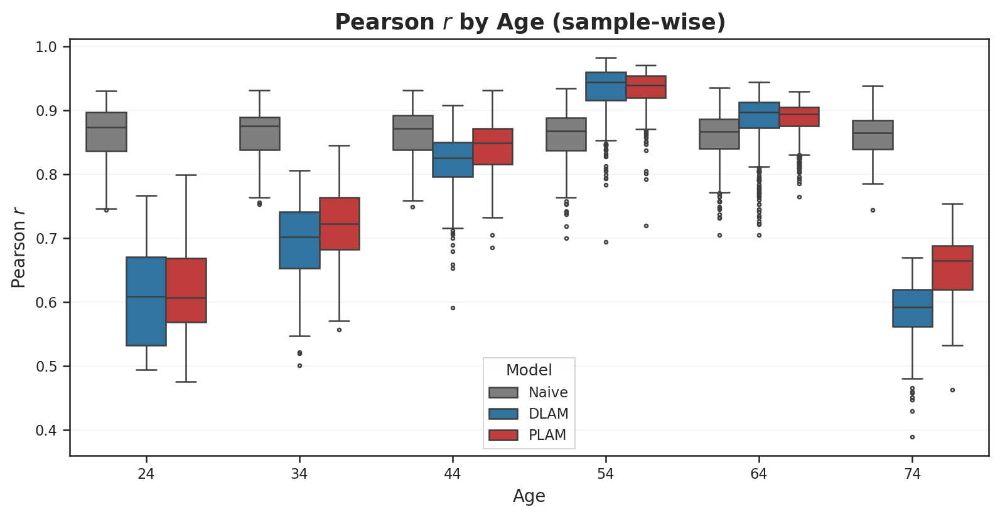

In [11]:
age_metrics, age_summary = compute_prediction_metrics(
    strat_view, unit='sample', stratify_by='age',
    metrics=TABLE_METRICS, n_jobs=N_JOBS,
)

fig, axes, _ = plot_stratified_scatter(
    strat_view, stratify_by='age',
    default_metric=DEFAULT_METRIC,
    max_points_per_model=10_000,
    balanced_sampling=SCATTER_BALANCED_SAMPLING,
    metric_summary=age_summary,
)

fig, ax = plot_stratified_distribution(
    age_metrics, stratify_by='age',
    metric=DEFAULT_METRIC, kind=DISTRIBUTION_KIND,
)

age_table = format_stratified_metric_table(
    age_metrics, stratify_by='age', metrics=TABLE_METRICS,
)
display(age_table)


model         Naive                                         DLAM  \
metric    pearson_r           r2         rmse     n    pearson_r   
age                                                                
24      0.866±0.045  0.664±0.126  0.987±0.221    61  0.609±0.073   
34      0.864±0.039  0.651±0.125  1.008±0.200    85  0.693±0.067   
44      0.866±0.036  0.646±0.125  1.011±0.200   241  0.817±0.050   
54      0.862±0.036  0.634±0.123  1.036±0.192   799  0.934±0.036   
64      0.863±0.033  0.626±0.124  1.044±0.186  1339  0.889±0.035   
74      0.859±0.031  0.627±0.118  1.044±0.171   125  0.583±0.052   

model                                           PLAM                \
metric            r2         rmse     n    pearson_r            r2   
age                                                                  
24      -3.144±0.388  3.487±0.127    61  0.617±0.065  -0.563±0.251   
34      -1.109±0.277  2.491±0.133    85  0.719±0.061   0.096±0.186   
44       0.226±0.164  1.499±0.147   241  0.843±0.045   0.599±0.116   
54       0.839±0.092  0.672±0.184   799  0.933±0.028   0.854±0.064   
64       0.772±0.080  0.812±0.135  1339  0.887±0.026   0.763±0.062   
74       0.020±0.161  1.703±0.138   125  0.653±0.050   0.197±0.169   

model                      
metric         rmse     n  
age                        
24      2.136±0.163    61  
34      1.626±0.165    85  
44      1.072±0.153   241  
54      0.648±0.137   799  
64      0.833±0.112  1339  
74      1.540±0.168   125

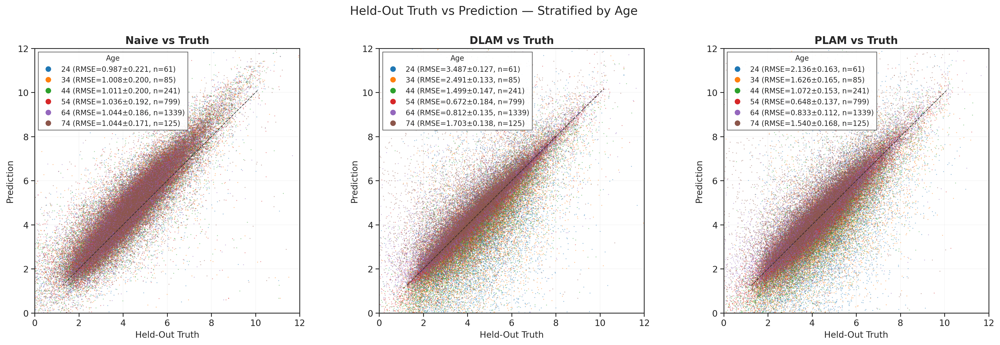

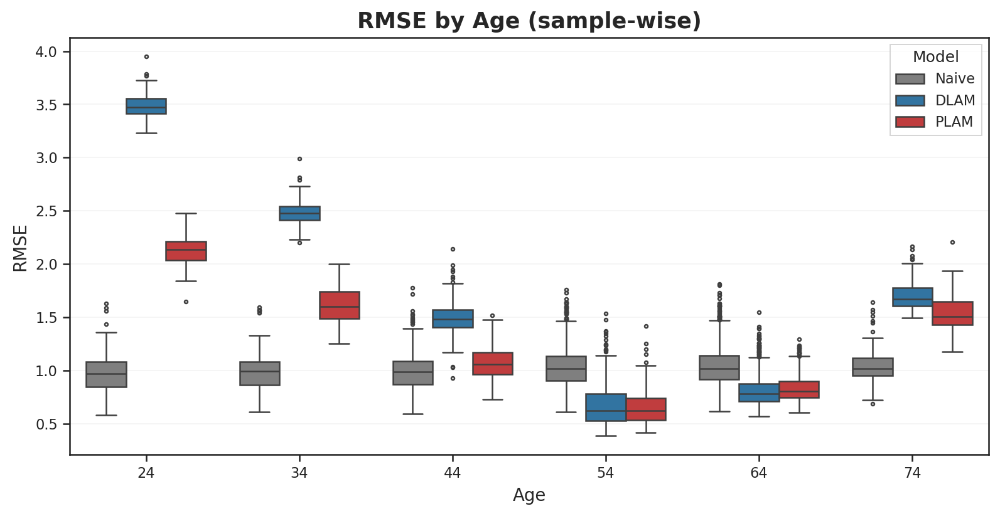

In [12]:
age_metrics, age_summary = compute_prediction_metrics(
    strat_view, unit='sample', stratify_by='age',
    metrics=TABLE_METRICS, n_jobs=N_JOBS,
)

fig, axes, _ = plot_stratified_scatter(
    strat_view, stratify_by='age',
    default_metric='rmse',
    max_points_per_model=SCATTER_MAX_POINTS_PER_MODEL,
    balanced_sampling=SCATTER_BALANCED_SAMPLING,
    metric_summary=age_summary,
)

fig, ax = plot_stratified_distribution(
    age_metrics, stratify_by='age',
    metric='rmse', kind=DISTRIBUTION_KIND,
)

age_table = format_stratified_metric_table(
    age_metrics, stratify_by='age', metrics=TABLE_METRICS,
)
display(age_table)


### Stratified by Region (`gtex_region`)

13-tissue tissue-level stratification. Add a follow-up cell to drill down on a region group
(e.g., `region_groups=['subcortical']` in `make_prediction_eval_view`) when needed.


/scratch/asr655/neuroinformatics/Seq2GeneEx/gtex_gp/src/eval_utils/eval_population.py:3667: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


model                                            Naive               \
metric                                       pearson_r           r2   
gtex_region                                                           
brain - anterior cingulate cortex (ba24)   0.887±0.026  0.668±0.082   
brain - cortex                             0.882±0.024  0.771±0.047   
brain - frontal cortex (ba9)               0.884±0.025  0.718±0.055   
brain - amygdala                           0.864±0.029  0.665±0.078   
brain - caudate (basal ganglia)            0.881±0.028  0.676±0.082   
brain - hippocampus                        0.840±0.027  0.603±0.068   
brain - hypothalamus                       0.866±0.025  0.607±0.082   
brain - nucleus accumbens (basal ganglia)  0.848±0.024  0.647±0.064   
brain - putamen (basal ganglia)            0.880±0.031  0.618±0.102   
brain - substantia nigra                   0.809±0.031  0.325±0.101   
Cerebellar hemisphere                      0.839±0.021  0.580±0.068   

model                                                               DLAM  \
metric                                            rmse    n    pearson_r   
gtex_region                                                                
brain - anterior cingulate cortex (ba24)   0.974±0.136  223  0.876±0.100   
brain - cortex                             0.798±0.096  240  0.859±0.103   
brain - frontal cortex (ba9)               0.899±0.103  252  0.874±0.094   
brain - amygdala                           0.991±0.144  181  0.880±0.107   
brain - caudate (basal ganglia)            0.980±0.140  279  0.889±0.094   
brain - hippocampus                        1.081±0.121  240  0.872±0.098   
brain - hypothalamus                       1.075±0.131  242  0.871±0.090   
brain - nucleus accumbens (basal ganglia)  1.029±0.118  273  0.875±0.101   
brain - putamen (basal ganglia)            1.073±0.165  250  0.890±0.093   
brain - substantia nigra                   1.438±0.130  176  0.828±0.105   
Cerebellar hemisphere                      1.142±0.107  294  0.837±0.091   

model                                                                     \
metric                                              r2         rmse    n   
gtex_region                                                                
brain - anterior cingulate cortex (ba24)   0.538±0.768  0.975±0.620  223   
brain - cortex                             0.483±0.825  1.026±0.604  240   
brain - frontal cortex (ba9)               0.571±0.702  0.955±0.552  252   
brain - amygdala                           0.611±0.634  0.917±0.537  181   
brain - caudate (basal ganglia)            0.606±0.671  0.917±0.573  279   
brain - hippocampus                        0.570±0.680  0.973±0.559  240   
brain - hypothalamus                       0.583±0.637  0.972±0.529  242   
brain - nucleus accumbens (basal ganglia)  0.555±0.764  0.976±0.612  273   
brain - putamen (basal ganglia)            0.626±0.601  0.913±0.562  250   
brain - substantia nigra                   0.472±0.672  1.149±0.588  176   
Cerebellar hemisphere                      0.496±0.698  1.123±0.563  294   

model                                             PLAM               \
metric                                       pearson_r           r2   
gtex_region                                                           
brain - anterior cingulate cortex (ba24)   0.882±0.080  0.709±0.285   
brain - cortex                             0.870±0.077  0.650±0.302   
brain - frontal cortex (ba9)               0.877±0.074  0.711±0.272   
brain - amygdala                           0.885±0.088  0.738±0.261   
brain - caudate (basal ganglia)            0.895±0.077  0.752±0.251   
brain - hippocampus                        0.878±0.080  0.723±0.249   
brain - hypothalamus                       0.872±0.081  0.688±0.283   
brain - nucleus accumbens (basal ganglia)  0.883±0.080  0.724±0.274   
brain - putamen (basal ganglia)            0.894±0.079  0.736±0.241   
brain - substantia nigr

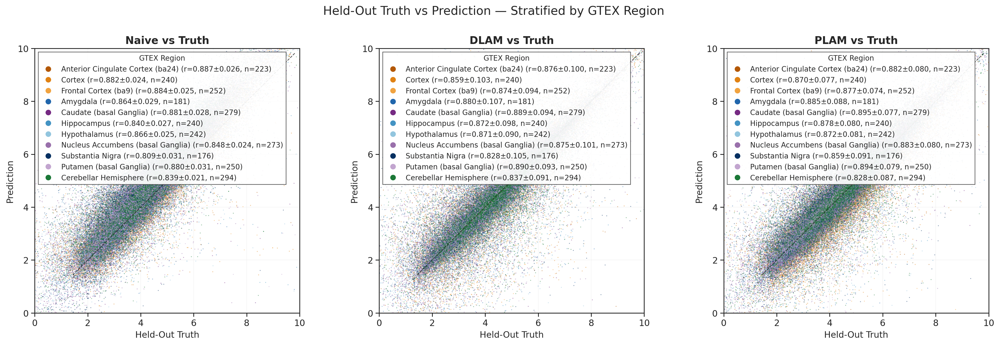

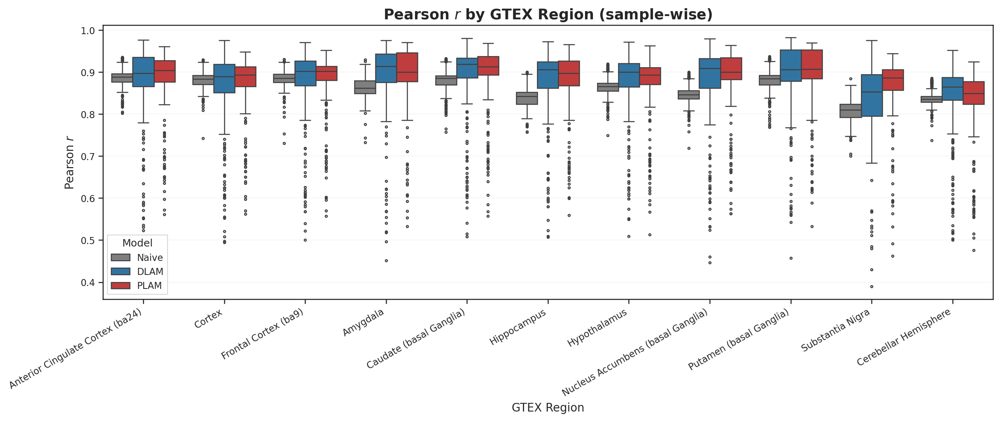

In [13]:
region_metrics, region_summary = compute_prediction_metrics(
    strat_view, unit='sample', stratify_by='gtex_region',
    metrics=TABLE_METRICS, n_jobs=N_JOBS,
)

fig, axes, _ = plot_stratified_scatter(
    strat_view, stratify_by='gtex_region',
    default_metric=DEFAULT_METRIC,
    max_points_per_model=SCATTER_MAX_POINTS_PER_MODEL,
    balanced_sampling=SCATTER_BALANCED_SAMPLING,
    metric_summary=region_summary,
)

fig, ax = plot_stratified_distribution(
    region_metrics, stratify_by='gtex_region',
    metric=DEFAULT_METRIC, kind=DISTRIBUTION_KIND,
)

region_table = format_stratified_metric_table(
    region_metrics, stratify_by='gtex_region', metrics=TABLE_METRICS,
)
display(region_table)


## Coverage, Combos, and Distance Effects

Sample-wise metric per subject vs the number of observed GTEx regions for that subject. Uses
`global_metrics` from the global stratification section above.


In [14]:
# --- LORO fold-combo (end of notebook) ---
FOLD_COMBO_COVERAGE_MIN      = 5
FOLD_COMBO_COVERAGE_MAX      = 12
FOLD_COMBO_METRIC            = 'mean_pearson'   # mean_pearson | mean_spearman | mean_r2 | mean_rmse
FOLD_COMBO_REFERENCE_MODEL   = 'plam'
# 'line' (default) | 'dist_to_nearest_train' | 'dist_to_centroid_train'
FOLD_COMBO_POINTS_STYLE      = 'dist_to_nearest_train'

# --- Distance-to-training plot ---
DISTANCE_COL                 = 'dist_to_nearest_train'  # or 'dist_to_nearest_train'
DISTANCE_N_BINS              = 20

,subject,model,subject_coverage,pearson_r
0,GTEX-1117F,dlam,9,0.893746
1,GTEX-1117F,naive,9,0.902587
2,GTEX-1117F,plam,9,0.895218
3,GTEX-111FC,dlam,10,0.891935
4,GTEX-111FC,naive,10,0.863340


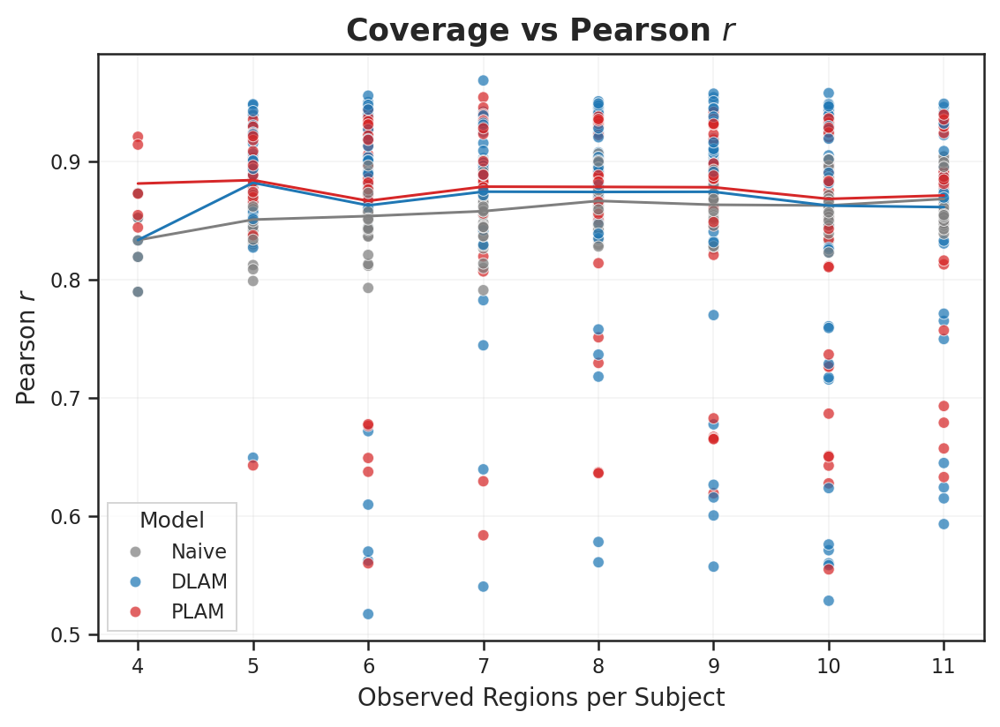

In [15]:
fig, ax, coverage_plot_df = plot_coverage_vs_metric(
    global_metrics,
    metric=DEFAULT_METRIC,
)
display(coverage_plot_df.head())


## LORO Fold-Combo Curves

Fold-combo summaries rank held-out region sets from worst to best performance per model.
Set `FOLD_COMBO_POINTS_STYLE='line'` for connected lines colored by `MODEL_COLORS`, or
`'dist_to_nearest_train'` / `'dist_to_centroid_train'` to render the same curves as a
scatter where marker color encodes distance from the held-out region to the training set
(shared colorbar) and marker shape encodes the model.

The matched overlay below ranks every model on the **reference model**'s combo order,
so model curves are directly comparable per fold-combo.


In [16]:
fold_perf_df, combo_df = compute_fold_combo_metrics_from_cache(
    CFG,
    PREPOST,
    coverage_min=FOLD_COMBO_COVERAGE_MIN,
    coverage_max=FOLD_COMBO_COVERAGE_MAX,
    models=MODELS,
    eval_gene_path=EVAL_GENE_LIST_PATH,
    n_jobs=N_JOBS,
)
print('fold_perf_df:', fold_perf_df.shape)
print('combo_df:', combo_df.shape)
display(combo_df.head())


fold_perf_df: (7890, 16)
combo_df: (3600, 17)


,coverage,fold_key,model,n_subjects,mean_pearson,std_pearson,mean_spearman,std_spearman,mean_r2,std_r2,mean_rmse,std_rmse,mean_points,dist_to_nearest_train,dist_to_centroid_train,eval_gene_mode,eval_gene_path
0,5,"hold=101|train=10,18,19,55",dlam,1,0.868148,NaN,0.923953,NaN,0.352933,NaN,1.383022,NaN,13618.0,53.664905,59.999099,all,None
1,5,"hold=101|train=10,18,19,61",dlam,1,0.849413,NaN,0.889179,NaN,0.117096,NaN,1.599925,NaN,13618.0,53.664905,52.280087,all,None
2,5,"hold=101|train=10,19,61,94",dlam,1,0.777344,NaN,0.785414,NaN,0.515425,NaN,1.200241,NaN,13618.0,54.306979,58.474974,all,None
3,5,"hold=101|train=7,10,16,61",dlam,1,0.871623,NaN,0.893645,NaN,0.703211,NaN,0.867162,NaN,13618.0,54.306979,73.814354,all,None
4,5,"hold=101|train=7,10,16,94",dlam,1,0.893869,NaN,0.912144,NaN,0.793710,NaN,0.772000,NaN,13618.0,54.306979,83.561026,all,None


,rank_kind,rank_tag,model,model_label,metric,score,rank_index,rank_percentile,coverage,n_subjects,fold_key,hold_parcel,hold_label,train_parcels,train_labels
0,independent,worst,naive,Naive,mean_pearson,0.731198,0,0.000000,7,1,"hold=64|train=10,16,18,55,61,94",64,frontal cortex (ba9),"[10, 16, 18, 55, 61, 94]","[caudate (basal ganglia), hypothalamus, nucleu..."
1,independent,median,naive,Naive,mean_pearson,0.865639,600,50.041701,9,3,"hold=19|train=7,10,16,18,61,64,94,101",19,putamen (basal ganglia),"[7, 10, 16, 18, 61, 64, 94, 101]","[Cerebellar hemisphere, caudate (basal ganglia..."
2,independent,best,naive,Naive,mean_pearson,0.933230,1199,100.000000,9,1,"hold=19|train=7,10,16,29,55,61,94,101",19,putamen (basal ganglia),"[7, 10, 16, 29, 55, 61, 94, 101]","[Cerebellar hemisphere, caudate (basal ganglia..."
3,independent,worst,dlam,DLAM,mean_pearson,0.457685,0,0.000000,8,1,"hold=19|train=7,16,18,29,55,61,64",19,putamen (basal ganglia),"[7, 16, 18, 29, 55, 61, 64]","[Cerebellar hemisphere, hypothalamus, nucleus ..."
4,independent,median,dlam,DLAM,mean_pearson,0.891738,600,50.041701,6,1,"hold=64|train=7,10,19,61,101",64,frontal cortex (ba9),"[7, 10, 19, 61, 101]","[Cerebellar hemisphere, caudate (basal ganglia..."
5,independent,best,dlam,DLAM,mean_pearson,0.981519,1199,100.000000,5,1,"hold=19|train=7,18,61,94",19,putamen (basal ganglia),"[7, 18, 61, 94]","[Cerebellar hemisphere, nucleus accumbens (bas..."
6,independent,worst,plam,PLAM,mean_pearson,0.504986,0,0.000000,7,1,"hold=7|train=10,18,29,61,64,101",7,Cerebellar hemisphere,"[10, 18, 29, 61, 64, 101]","[caudate (basal ganglia), nucleus accumbens (b..."
7,independent,median,plam,PLAM,mean_pearson,0.892149,600,50.041701,9,4,"hold=18|train=7,10,19,29,55,61,64,101",18,nucleus accumbens (basal ganglia),"[7, 10, 19, 29, 55, 61, 64, 101]","[Cerebellar hemisphere, caudate (basal ganglia..."
8,independent,best,plam,PLAM,mean_pearson,0.970074,1199,100.000000,6,1,"hold=29|train=10,18,55,61,94",29,amygdala,"[10, 18, 55, 61, 94]","[caudate (basal ganglia), nucleus accumbens (b..."


,rank_kind,rank_tag,model,model_label,metric,score,rank_index,rank_percentile,coverage,n_subjects,fold_key,hold_parcel,hold_label,train_parcels,train_labels
0,matched_to_plam,worst,naive,Naive,mean_pearson,0.858762,0,0.000000,7,1,"hold=7|train=10,18,29,61,64,101",7,Cerebellar hemisphere,"[10, 18, 29, 61, 64, 101]","[caudate (basal ganglia), nucleus accumbens (b..."
1,matched_to_plam,median,naive,Naive,mean_pearson,0.845806,600,50.041701,9,4,"hold=18|train=7,10,19,29,55,61,64,101",18,nucleus accumbens (basal ganglia),"[7, 10, 19, 29, 55, 61, 64, 101]","[Cerebellar hemisphere, caudate (basal ganglia..."
2,matched_to_plam,best,naive,Naive,mean_pearson,0.850843,1199,100.000000,6,1,"hold=29|train=10,18,55,61,94",29,amygdala,"[10, 18, 55, 61, 94]","[caudate (basal ganglia), nucleus accumbens (b..."
3,matched_to_plam,worst,dlam,DLAM,mean_pearson,0.519287,0,0.000000,7,1,"hold=7|train=10,18,29,61,64,101",7,Cerebellar hemisphere,"[10, 18, 29, 61, 64, 101]","[caudate (basal ganglia), nucleus accumbens (b..."
4,matched_to_plam,median,dlam,DLAM,mean_pearson,0.907985,600,50.041701,9,4,"hold=18|train=7,10,19,29,55,61,64,101",18,nucleus accumbens (basal ganglia),"[7, 10, 19, 29, 55, 61, 64, 101]","[Cerebellar hemisphere, caudate (basal ganglia..."
5,matched_to_plam,best,dlam,DLAM,mean_pearson,0.930071,1199,100.000000,6,1,"hold=29|train=10,18,55,61,94",29,amygdala,"[10, 18, 55, 61, 94]","[caudate (basal ganglia), nucleus accumbens (b..."
6,matched_to_plam,worst,plam,PLAM,mean_pearson,0.504986,0,0.000000,7,1,"hold=7|train=10,18,29,61,64,101",7,Cerebellar hemisphere,"[10, 18, 29, 61, 64, 101]","[caudate (basal ganglia), nucleus accumbens (b..."
7,matched_to_plam,median,plam,PLAM,mean_pearson,0.892149,600,50.041701,9,4,"hold=18|train=7,10,19,29,55,61,64,101",18,nucleus accumbens (basal ganglia),"[7, 10, 19, 29, 55, 61, 64, 101]","[Cerebellar hemisphere, caudate (basal ganglia..."
8,matched_to_plam,best,plam,PLAM,mean_pearson,0.970074,1199,100.000000,6,1,"hold=29|train=10,18,55,61,94",29,amygdala,"[10, 18, 55, 61, 94]","[caudate (basal ganglia), nucleus accumbens (b..."


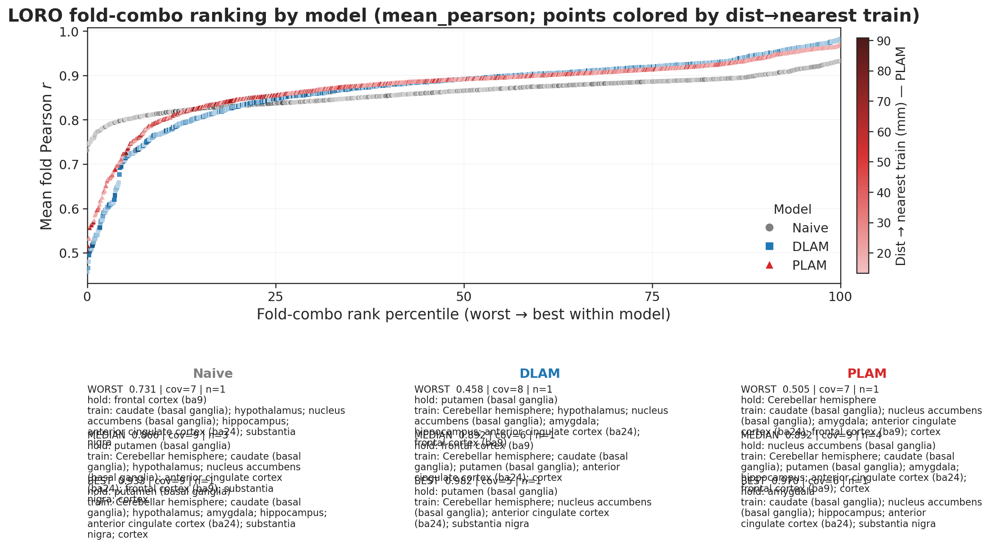

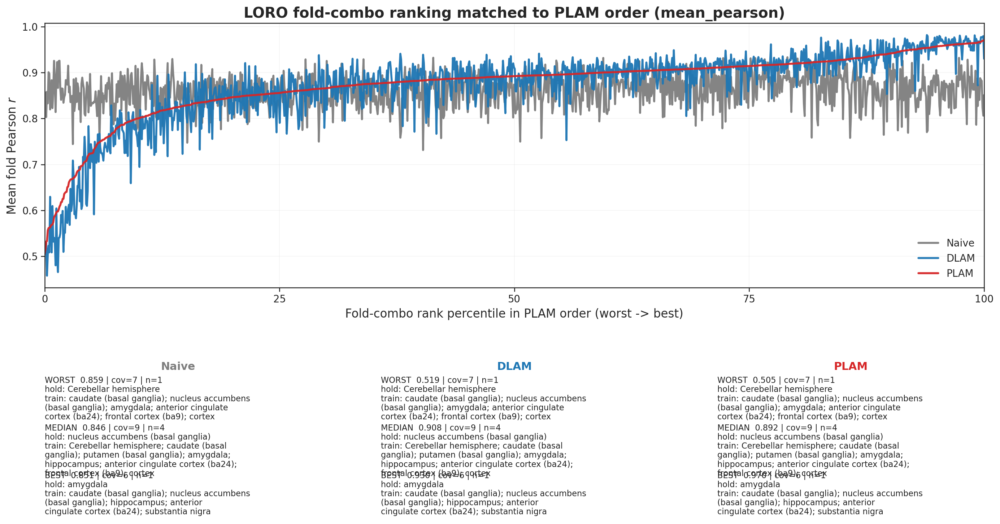

In [17]:
fig, axes, independent_split_df = plot_fold_combo_ranked_overlay(
    combo_df,
    PREPOST,
    models=MODELS,
    metric=FOLD_COMBO_METRIC,
    points_style=FOLD_COMBO_POINTS_STYLE,
)
display(independent_split_df)

fig, axes, matched_split_df, matched_combo_df = plot_fold_combo_matched_overlay(
    combo_df,
    PREPOST,
    models=MODELS,
    reference_model=FOLD_COMBO_REFERENCE_MODEL,
    metric=FOLD_COMBO_METRIC,
    show_points=False,
)
display(matched_split_df)


### Fold-Difficulty Decomposition

Per-fold cross-subject mean vs std. Splits structurally-hard folds (low mean, low std) from subject-mixing failures (low mean, high std). Singletons and `n<5` fold-combos are excluded — std on n<5 is sampling noise. Marker area scales with `n_subjects` so visual weight tracks evidence.


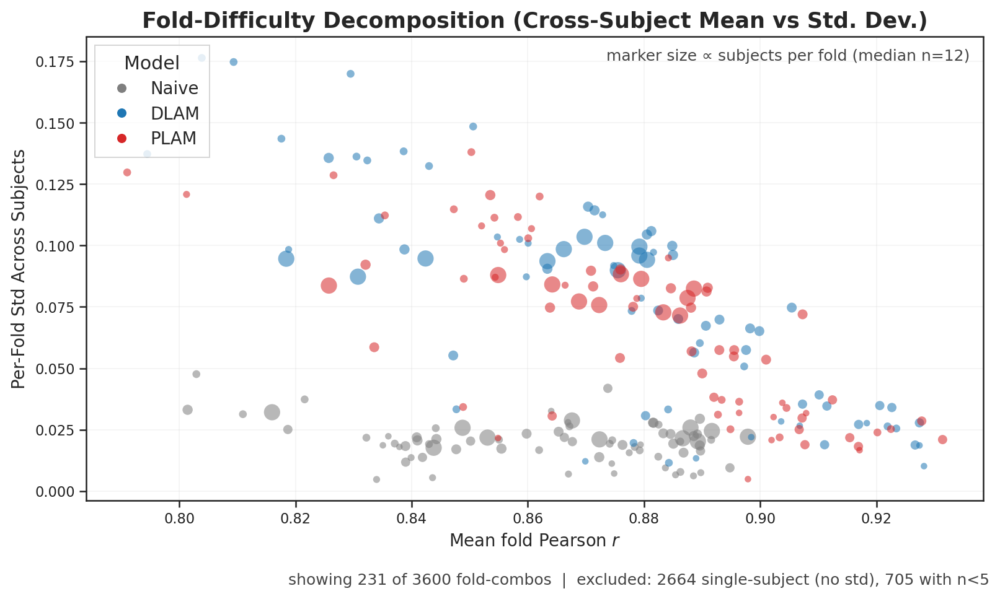

In [18]:
fig, ax = plot_fold_std_vs_mean(
    combo_df,
    metric=FOLD_COMBO_METRIC,
    min_subjects=5,
)


## Distance to Training vs Performance

Each LORO fold split is a point: x = distance from the held-out region to the (centroid of the)
training set, y = fold metric. A quantile-binned mean ± SEM line is overlaid per model
(up to `DISTANCE_N_BINS` bins).


,model,_bin,x_center,mean,sem,n
0,dlam,0,14.392766,0.873805,0.006353,162
1,dlam,1,15.429018,0.849223,0.008452,61
2,dlam,2,16.472597,0.898074,0.004816,180
3,dlam,3,17.959306,0.852545,0.011580,63
4,dlam,4,18.723823,0.882090,0.009484,78


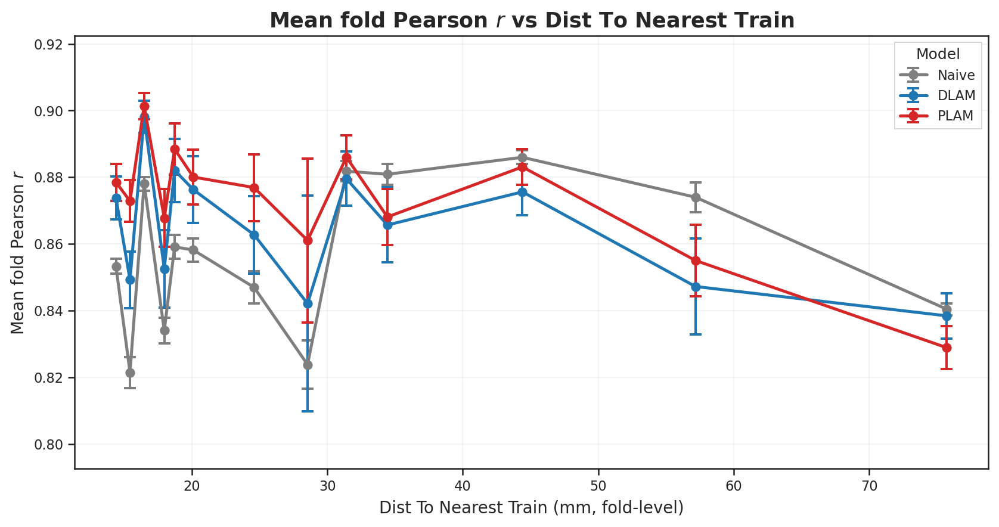

In [19]:
fig, ax, distance_bin_df = plot_distance_to_train_vs_metric(
    combo_df,
    metric=FOLD_COMBO_METRIC,
    distance_col=DISTANCE_COL,
    n_bins=DISTANCE_N_BINS,
)
display(distance_bin_df.head())
